# Computing values and significance for multirun ensembles

This approach leverages two powerful functions from the xarray python library, apply_ufunc and the dataset copy function.  

## load the dataset and import some packages

In [1]:
# ========== Import some usefull packages ============
import os
import sys
# ===== CHange the dir to the script location =====
#sys.path.append(os.getcwd())

import numpy as np
import pandas as pd
import xarray as xr
import bottleneck as bn
from scipy import stats
import matplotlib.pyplot as plt
import statsmodels.stats.multitest as smsM
import cartopy.crs as ccrs


# ========== Read in test ensemble ==========
# The ensemble result for one TSSRattribution category
ds_ens = xr.open_dataset("./data/AUS_TSSRattribution_ensemble_example.nc")
#ds_ens = xr.open_dataset("./data/workingset/AUS_ExportedTSSResults_ClimateChange_ensemble.nc")

# ========== Set the name of the var and the pvalue var ==========
var  = "ClimateChange"
pvar = "ClimateChange.Pvalue"

# ===== print out the datasets =====
print(ds_ens)

# ========== Pull out the var and the pvalues inte xarray datarray format ==========
raw_cv = ds_ens[var]
raw_pv = ds_ens[pvar]
# In building the dataset, pvalues were rounded to zero to save space. However, pvalues  
# of 0 break some stats functions, So its nessary to replace them with a small float
raw_pv = raw_pv.where(raw_pv != 0, 0.0000001) 



<xarray.Dataset>
Dimensions:               (latitude: 138, longitude: 176, run: 12, time: 1)
Coordinates:
  * latitude              (latitude) float64 -10.13 -10.38 ... -44.15 -44.4
  * longitude             (longitude) float64 112.2 112.4 112.7 ... 155.7 155.9
  * time                  (time) datetime64[ns] 2015-12-31
  * run                   (run) int64 0 1 2 3 4 5 6 7 8 9 10 11
Data variables:
    ClimateChange         (time, latitude, longitude, run) float64 ...
    ClimateChange.Pvalue  (time, latitude, longitude, run) float64 ...
Attributes:
    title:          Multi-Run TSS-RESTREND Ensemble Results
    summary:        Multi-Run TSS-RESTREND Ensemble Dataset created using Dat...
    Conventions:    CF-1.7
    history:        2020-07-29 11:42:46.149475: Netcdf file created using Dat...
    creator_name:   Arden Burrell
    creator_url:    ardenburrell.com
    creator_email:  arden.burrell@gmail.com
    institution:    WHRC
    date_created:   2020-07-29 11:42:46.149535
    refer

## Combined p-value significance
The first of the two significance tests is the combine pvalue signifance test. At each pixel, the pvalues are combined using the scipy stats combine_pvalues function and then a FDR method is used to correct for field significance. To do this in a way that leverages the power of xarray.......
- Something about performance. 
- Something about vectorise function


In [2]:

def _combine_pvalue2d(pvals):
    """
    takes an array and removes nans then combines
    args:
        pvalues:    np.array
            the pvalues to be combined 
    return:
        
    """

    if bn.allnan(pvals):
        return np.NAN
    else:
        ___, pv = stats.combine_pvalues(pvals[~np.isnan(pvals)])
        return pv

### Create the FDR significane function.  
FIrst function is to compute perform the FDR adjustment. Under the hood, xarray dataarrays are n-dimensional numpy arrays. The first function is used by both significance checks.  This FDR function will take a 3d array (lon, lat and 1d of time), and return an array of the same shape.  


In [3]:
def FDRSignificanceCorrection(da, FDRmethod = "fdr_bh", alpha = 0.10):
    """
    Takes the results of an existing trend detection aproach and modifies them to
    account for multiple comparisons.  
    args
        da: 3d Numpy array. 
        	The time dime should have a size of 1
        FDRmethod: str
            The method to use for FDR
        alpha: float (9-1)
            Significance level
    returns:
        res: n-darray
            Same shape as da.  ! for significant, 0 for not significant. NaN for bad/no data
    
    """
    if FDRmethod == "fdr_by":
        t_method = "Adjusting for multiple comparisons using Benjamini/Yekutieli"
    elif FDRmethod == "fdr_bh":
        t_method = "Adjusting for multiple comparisons using Benjamini/Hochberg"
    else:
        raise ValueError("unknown MultipleComparisons method: %s, must be either fdr_by or fdr_bh " % FDRmethod)

    # ========== Work out the pvalue name =========== 
    shape = da.shape
    # ========== Locate the p values and reshape them into a 1d array ==========
    # ++++++++++ Find the pvalues ++++++++++
    ODimDa     = da.ravel()
    isnan      = np.isnan(ODimDa)
    
    # ++++++++++ pull out the non nan pvalus ++++++++++
    pvalue1d   = ODimDa[~isnan]
    
    # =========== Perform the MC correction ===========
    pvalue_adj = smsM.multipletests(pvalue1d, method=FDRmethod, alpha=alpha)
    # =========== Get the significance in bool ===========
    sigfloat   = pvalue_adj[0].astype(float)

    # make an empty dataarray
    re         = np.zeros_like(ODimDa)
    re[~isnan] = sigfloat
    re[isnan]  = np.NaN

    res = re.reshape(shape)
    # print(pvalue_adj[0], pvalue_adj[0].shape)
    return res

The next step is to apply those two functions to the datasets.  ..... In this case we will let xarray handle vectorxing the function as its more readable and easier to debug in the event or errors. However, according to xarray documentation, there is the potential for significance performance gains by pre vectorising the function using numpy [vectorise](https://numpy.org/doc/stable/reference/generated/numpy.vectorize.html) or the even faster numba [vectorise](https://numba.pydata.org/numba-doc/latest/user/vectorize.html). Numba  even supports GPU complation.  
- Mention Dask parallel.  


<xarray.DataArray 'ClimateChange.Pvalue' (time: 1, latitude: 138, longitude: 176)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude   (latitude) float64 -10.13 -10.38 -10.63 ... -43.9 -44.15 -44.4
  * longitude  (longitude) float64 112.2 112.4 112.7 112.9 ... 155.4 155.7 155.9
  * time       (time) datetime64[ns] 2015-12-31


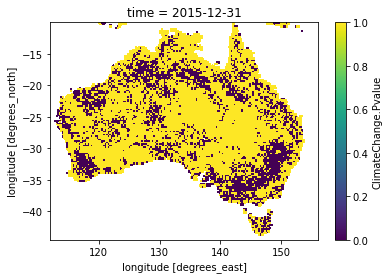

In [4]:
pvals    = xr.apply_ufunc(_combine_pvalue2d, raw_pv, input_core_dims=[["run"]], vectorize=True) #"time", "latitude", "longitude"
FDRpvsig =  pvals.copy(data = FDRSignificanceCorrection(pvals.values))

print(FDRpvsig)
FDRpvsig.plot()
plt.show()

## IPCC Signifcance and agreement

For multirun ensembles, the IPCC uses the following rule.  For a pixel to to be significant, more than 50% of the ensemble members (runs) must be significant, and of those signifcant runs >80% must agree on the direction of the change.  

To do this we will again leverage xarrays apply_ufunc......

In [5]:
def IPCC(direction, significance):
    """
    Function to caluculate the significance using ipcc criteria
    args:
        direction: npA
            the actual change values for a given pixel
        significance: npA
            FDR adjusted significance
    returns:
        ipcc_sig:   npA
            0 for not sig, 1 for sig
    """
    if bn.allnan(direction):
        return np.NaN
    else:
        totnum = bn.nansum((~np.isnan(direction)).astype(float))
        direc  = direction[~np.isnan(direction)]
        signi  = significance[~np.isnan(direction)]


        # Find the number of significant runs
        signum = np.sum(signi==1).astype(float)
        if signum == 0:
            # Remove the badly behaving zeros
            return 0

        # ========== IPCC significance testing ==========
        # +++++ 50% significant +++++
        sig50  = signum>=0.50
    
        # # +++++ 80% agreement +++++
        # agreement
        ag = [np.sum(np.logical_and((direc > 0), (signi == 1))), np.sum(np.logical_and((direc < 0), (signi == 1)))]
        agree = float(bn.nanmax(ag))

        agr80 = (agree/signum)>= 0.80
        return int(agr80)


Now that the fuctions are all setup, all thats left is to put them together.  

<xarray.DataArray (time: 1, latitude: 138, longitude: 176)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * latitude   (latitude) float64 -10.13 -10.38 -10.63 ... -43.9 -44.15 -44.4
  * longitude  (longitude) float64 112.2 112.4 112.7 112.9 ... 155.4 155.7 155.9
  * time       (time) datetime64[ns] 2015-12-31


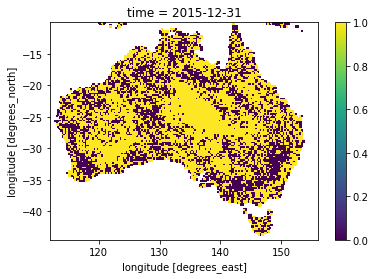

In [6]:
# ========== IPCC signifcance ==========
# +++++ Take the individual runes and calculate the FDR significane for each one +++++
fdr_ls = [FDRSignificanceCorrection(raw_pv.isel(run=rn).values) for rn in raw_pv.run]
# +++++ Using xarray's copy (data = ...), build a new FDR significance dataarray with the the same shape as raw_pv. +++++
FDRbool = raw_pv.copy(data=np.stack(fdr_ls, axis=-1))
# +++++ Apply the IPCC ensemble criteria to the dattarray +++++
IPCCsig  = xr.apply_ufunc(IPCC,raw_cv, FDRbool, input_core_dims=[["run"], ["run"]], vectorize=True)

print(IPCCsig)
IPCCsig.plot()
plt.show()

Finally, all thats left is to calculate the ensemble mean, build a new dataset and write it to a netcdf file.  

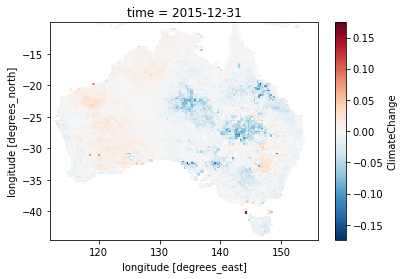

In [7]:
# ========== Calculate the ensembe mean ==========
ensmean = raw_cv.mean(dim="run")
ensmean.plot()
plt.show()